### instalar dependencias

In [1]:
!pip install smart-open
!pip install --upgrade gensim   
!pip install nltk
!pip install pyLDAvis
!pip install pandas

Requirement already up-to-date: gensim in c:\users\rojasd\anaconda3\lib\site-packages (4.0.1)


In [2]:
import pandas as pd
pd.__version__

'1.2.4'

In [3]:
#importar librerías
import pandas as pd
import numpy as np
import nltk
import re

In [4]:
# settings en nltk: tokenizador y stopwords
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('stopwords')
stop_words_nltk = set(stopwords.words('spanish'))

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\rojasd\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rojasd\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
import pickle 
import random

In [6]:
# Mostrar la ruta del archivo indiferente del sistema operativo
import os
os.getcwd()

'C:\\Users\\rojasd\\Desktop\\CAOBA\\Repositorios\\proy-segmentacion\\jupyter\\CRojas04'

In [56]:
main_path="C:\\Users\\rojasd\\Desktop\\CAOBA\\Repositorios\\proy-segmentacion\\"
data_path="\\data\\03 - Trusted"

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [57]:
os.chdir(main_path + data_path)

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [11]:
data2=pickle.load( open(r'Fuente_2_vista_minable.pickle', "rb" ) )
data2.head()

,nit,entidad_matriz,year,entidad,localizacion,localizacion_desc,mision_vision,pers_estrategica,ppto_global,mes_proyectado,...,ref_contrato,date_publised,modalidad,contacto,cod_producto,nombre_producto,cod_clase,nombre_clase,cod_familia,nombre_familia
22,800010350,ALCALDIA MUNICIPAL DE MURILLO,2019,ALCALDIA MUNICIPAL DE MURILLO,CO-TOL-73461,Tolima,MISION: Proveer los instrumentos necesarios pa...,Lograr la estructuración del plan de compras 2...,2971812351,Enero,...,CD - 003,2019-01-09 18:06:28.570000000,CCE-16-Servicios_profesionales_gestion,Monica Andrea Hernandez Salinas,V1.80111620,Servicios temporales de recursos humanos,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos
41,800012873,MUNICIPIO DE TAURAMENA,2019,MUNICIPIO DE TAURAMENA,CO-CAS-85410,Casanare,MISIÓN: Prestar servicio efectivo a la comunid...,"La Alcaldía municipal de Tauramena Casanare, t...",114339387326,Julio,...,CRE-MT-SDS-016-2019,2018-12-29 01:24:49.073000000,CCE-06-Seleccion_Abreviada_Menor_Cuantia,MARIA EUGENIA RODRIGUEZ FIGUEREDO,V1.93141506,Servicios de bienestar social,V1.93141500,Desarrollo y servicios sociales,V1.93140000,Servicios comunitarios y sociales
75,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,004-2019,2019-01-11 15:10:41.077000000,CCE-16-Servicios_profesionales_gestion,AMANDA LUCIA BARCENAS MANTILLA,V1.80111500,Desarrollo de recursos humanos,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ..."
76,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,015-2019,2019-01-11 15:10:41.077000000,CCE-16-Servicios_profesionales_gestion,AMANDA LUCIA BARCENAS MANTILLA,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ..."
77,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,017-2019,2019-01-11 15:10:41.077000000,CCE-16-Servicios_profesionales_gestion,AMANDA LUCIA BARCENAS MANTILLA,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ..."


In [12]:
# Renombrar las columnas 
data2  = data2.rename(columns={
     'year':                        "periodo", 
     
     
})

In [13]:
print(list(data2.columns))

['nit', 'entidad_matriz', 'periodo', 'entidad', 'localizacion', 'localizacion_desc', 'mision_vision', 'pers_estrategica', 'ppto_global', 'mes_proyectado', 'precio_base', 'date_last_publication', 'ref_contrato', 'date_publised', 'modalidad', 'contacto', 'cod_producto', 'nombre_producto', 'cod_clase', 'nombre_clase', 'cod_familia', 'nombre_familia']


In [14]:
data2.shape

(349682, 22)

### Tokenización

In [15]:
# función general para preparación de datos: tokenización, remoción caracteres especiales
# minusculas.... no incluido stemming y lematización.
def textprep(line):
    tokens = nltk.word_tokenize(str(line))
    tokens = [w.lower() for w in tokens if len(w)>1]
    tokens = [re.sub(r'[^A-Za-z0-9]+','',w) for w in tokens]
    tokens = [w for w in tokens if w not in stop_words_nltk] 
    return tokens

In [16]:
from nltk.tokenize import sent_tokenize

text=str(data2["mision_vision"])
tokenized_sent= sent_tokenize(text)
print(tokenized_sent)

['22        MISION: Proveer los instrumentos necesarios pa...\n41        MISIÓN: Prestar servicio efectivo a la comunid...\n75        Bomberos de Bucaramanga es una Institución Pub...\n76        Bomberos de Bucaramanga es una Institución Pub...\n77        Bomberos de Bucaramanga es una Institución Pub...\n                                ...                        \n863960    La Subred Integrada de servicios de Salud Sur ...\n863961    La Subred Integrada de servicios de Salud Sur ...\n863962    La Subred Integrada de servicios de Salud Sur ...\n863963    La Subred Integrada de servicios de Salud Sur ...\n863968    Contribuir a la calidad de vida de nuestros us...\nName: mision_vision, Length: 349682, dtype: object']


In [17]:
tokens = [t for t in text.split()]

freq = nltk.FreqDist(tokens)


for key,val in freq.items():

    print (str(key) + ':' + str(val))

22:1
MISION::1
Proveer:1
los:1
instrumentos:1
necesarios:1
pa...:1
41:1
MISIÓN::1
Prestar:1
servicio:1
efectivo:1
a:2
la:2
comunid...:1
75:1
Bomberos:3
de:13
Bucaramanga:3
es:3
una:3
Institución:3
Pub...:3
76:1
77:1
...:5
863960:1
La:4
Subred:4
Integrada:4
servicios:4
Salud:4
Sur:4
863961:1
863962:1
863963:1
863968:1
Contribuir:1
calidad:1
vida:1
nuestros:1
us...:1
Name::1
mision_vision,:1
Length::1
349682,:1
dtype::1
object:1


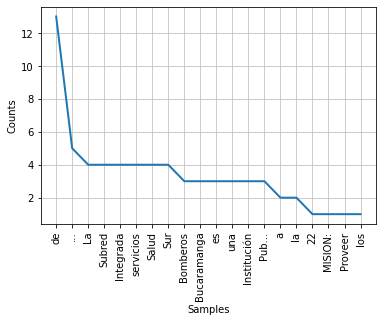

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [18]:
freq.plot(20, cumulative=False)

In [19]:
from nltk.corpus import stopwords
import nltk
nltk.download("stopwords")
stop_words = stopwords.words('spanish')

clean_tokens = tokens[:]

sr = stopwords.words('spanish')

for token in tokens:

    if token in stopwords.words('spanish'):

        clean_tokens.remove(token)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rojasd\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [32]:
from nltk.corpus import stopwords
import nltk
nltk.download("stopwords")
stop_words = stopwords.words('spanish')

clean_tokens = tokens[:]

sr = stopwords.words('spanish')

for token in tokens:

    if token in ["La", "a", "o", "la", "del", "de", "es", "ser", "una", "infraestructura","nacional", "como", "mision","vision" ]  :

        clean_tokens.remove(token)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rojasd\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [33]:
freq2 = nltk.FreqDist(clean_tokens)


for key,val in freq.items():

    print (str(key) + ':' + str(val))

22:1
MISION::1
Proveer:1
los:1
instrumentos:1
necesarios:1
pa...:1
41:1
MISIÓN::1
Prestar:1
servicio:1
efectivo:1
a:2
la:2
comunid...:1
75:1
Bomberos:3
de:13
Bucaramanga:3
es:3
una:3
Institución:3
Pub...:3
76:1
77:1
...:5
863960:1
La:4
Subred:4
Integrada:4
servicios:4
Salud:4
Sur:4
863961:1
863962:1
863963:1
863968:1
Contribuir:1
calidad:1
vida:1
nuestros:1
us...:1
Name::1
mision_vision,:1
Length::1
349682,:1
dtype::1
object:1


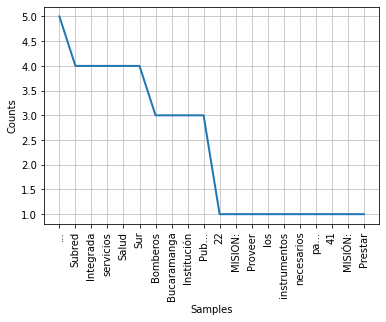

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [34]:
freq2.plot(20,cumulative=False)

#### Stemming

In [35]:
#stemming

words  = nltk.tokenize.WhitespaceTokenizer().tokenize(str(data2))
df = pd.DataFrame()
df['OriginalWords'] = pd.Series(words)
#porter's stemmer
porterStemmedWords = [nltk.stem.PorterStemmer().stem(word) for word in words]
df['PorterStemmedWords'] = pd.Series(porterStemmedWords)
#SnowBall stemmer
snowballStemmedWords = [nltk.stem.SnowballStemmer("spanish").stem(word) for word in words]
df['SnowballStemmedWords'] = pd.Series(snowballStemmedWords)
df

,OriginalWords,PorterStemmedWords,SnowballStemmedWords
0,nit,nit,nit
1,entidad_matriz,entidad_matriz,entidad_matriz
2,periodo,periodo,period
3,\,\,\
4,22,22,22
...,...,...,...
765,[349682,[349682,[349682
766,rows,row,rows
767,x,x,x
768,22,22,22


#### Lematización

In [36]:
from nltk.stem.wordnet import WordNetLemmatizer
lem= WordNetLemmatizer()

from nltk.stem.porter import PorterStemmer
stem = PorterStemmer()

word = "misiones"
print("lemmatized word:", lem.lemmatize(word,"v"))
print("Stemmed Word:",stem.stem(word))

lemmatized word: misiones
Stemmed Word: mision


In [37]:
words  = nltk.tokenize.WhitespaceTokenizer().tokenize(str(data2))
df = pd.DataFrame()
df['OriginalWords'] = pd.Series(words)
#WordNet Lemmatization
wordNetLemmatizedWords = [nltk.stem.WordNetLemmatizer().lemmatize(word) for word in words]
df['WordNetLemmatizer'] = pd.Series(wordNetLemmatizedWords)
df

,OriginalWords,WordNetLemmatizer
0,nit,nit
1,entidad_matriz,entidad_matriz
2,periodo,periodo
3,\,\
4,22,22
...,...,...
765,[349682,[349682
766,rows,row
767,x,x
768,22,22


### LDA

In [38]:
# función general para preparación de datos: tokenización, remoción caracteres especiales
# minusculas.... no incluido stemming y lematización.
def textprep(line):
    tokens = nltk.word_tokenize(str(line))
    tokens = [w.lower() for w in tokens if len(w)>1]
    tokens = [re.sub(r'[^A-Za-z0-9]+','',w) for w in tokens]
    tokens = [w for w in tokens if w not in stop_words_nltk] 
    return tokens

In [39]:
# creación de columna con tokenización de una columna de interés especifica
data2['tokens_pers_estrategica'] = data2.apply(lambda row: textprep(row['pers_estrategica']), axis=1)
data2.head()

,nit,entidad_matriz,periodo,entidad,localizacion,localizacion_desc,mision_vision,pers_estrategica,ppto_global,mes_proyectado,...,date_publised,modalidad,contacto,cod_producto,nombre_producto,cod_clase,nombre_clase,cod_familia,nombre_familia,tokens_pers_estrategica
22,800010350,ALCALDIA MUNICIPAL DE MURILLO,2019,ALCALDIA MUNICIPAL DE MURILLO,CO-TOL-73461,Tolima,MISION: Proveer los instrumentos necesarios pa...,Lograr la estructuración del plan de compras 2...,2971812351,Enero,...,2019-01-09 18:06:28.570000000,CCE-16-Servicios_profesionales_gestion,Monica Andrea Hernandez Salinas,V1.80111620,Servicios temporales de recursos humanos,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,"[lograr, estructuracin, plan, compras, 2019, m..."
41,800012873,MUNICIPIO DE TAURAMENA,2019,MUNICIPIO DE TAURAMENA,CO-CAS-85410,Casanare,MISIÓN: Prestar servicio efectivo a la comunid...,"La Alcaldía municipal de Tauramena Casanare, t...",114339387326,Julio,...,2018-12-29 01:24:49.073000000,CCE-06-Seleccion_Abreviada_Menor_Cuantia,MARIA EUGENIA RODRIGUEZ FIGUEREDO,V1.93141506,Servicios de bienestar social,V1.93141500,Desarrollo y servicios sociales,V1.93140000,Servicios comunitarios y sociales,"[alcalda, municipal, tauramena, casanare, obje..."
75,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,2019-01-11 15:10:41.077000000,CCE-16-Servicios_profesionales_gestion,AMANDA LUCIA BARCENAS MANTILLA,V1.80111500,Desarrollo de recursos humanos,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...","[actividad, bomberil, reconoce, servicio, pbli..."
76,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,2019-01-11 15:10:41.077000000,CCE-16-Servicios_profesionales_gestion,AMANDA LUCIA BARCENAS MANTILLA,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...","[actividad, bomberil, reconoce, servicio, pbli..."
77,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,2019-01-11 15:10:41.077000000,CCE-16-Servicios_profesionales_gestion,AMANDA LUCIA BARCENAS MANTILLA,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...","[actividad, bomberil, reconoce, servicio, pbli..."


### Construir el BoW (diccionario) de términos

In [40]:
# Creación del BoW - en gensim es Dictionary
from gensim.corpora import Dictionary
dictionary = Dictionary(data2.tokens_pers_estrategica)

C:\Users\rojasd\Anaconda3\lib\site-packages\gensim\similarities\__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


In [42]:
# Bag-of-words representation of the documents.
corpus = [dictionary.doc2bow(doc) for doc in data2.tokens_pers_estrategica]

##### no correr archivo pesado

In [43]:
print(corpus)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [44]:
print(dictionary)

Dictionary(5703 unique tokens: ['2019', 'acorde', 'compras', 'desarrollo', 'ejecucin']...)



### Construir matriz de documentos vs términos

In [45]:
# libreria para paralelizar
import multiprocessing as mp
import time

t0 = time.time()
pool = mp.Pool(mp.cpu_count())
doc_term_matrix = pool.map(dictionary.doc2bow, [sentence for sentence in data2.tokens_pers_estrategica])
pool.close()
print(time.time()-t0)

8.207520246505737


In [46]:
doc_term_matrix

[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 1),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 2),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1)],
 [(3, 1),
  (9, 1),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 2),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 1),
  (59, 2),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 1),
  (66, 1),
  (67, 3),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 2),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 2),
  (76, 2),
  (77, 1),
  (78, 1)],
 [(25, 2),
  (67, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 1),
  (83, 1),
  (84, 2),
  (85, 1),
  (86, 1),
  (87, 1)

### Construir modelo LDA

In [47]:
from gensim.models.ldamulticore import LdaMulticore

t0 = time.time()
lda_model = LdaMulticore(doc_term_matrix, num_topics=20, id2word = dictionary, passes=10, workers=10)
print(time.time()-t0)

132.1179518699646


In [48]:
def assigntopic(doc):
    vector = lda_model[dictionary.doc2bow(doc)] 
    # opción 1: todos los tópicos ordenados de mayor a menor, podria ser topN tambien asi: return vector[:5] n=5
    vector = sorted(vector, key=lambda item: -item[1])
    # opción 2: asignar el tópico mayor a cada documento
    #vector = max(vector,key=lambda item: item[1])
    return vector

In [49]:
data2['topics'] = data2.apply(lambda row: assigntopic(row['tokens_pers_estrategica']), axis=1)
data2.head()

,nit,entidad_matriz,periodo,entidad,localizacion,localizacion_desc,mision_vision,pers_estrategica,ppto_global,mes_proyectado,...,modalidad,contacto,cod_producto,nombre_producto,cod_clase,nombre_clase,cod_familia,nombre_familia,tokens_pers_estrategica,topics
22,800010350,ALCALDIA MUNICIPAL DE MURILLO,2019,ALCALDIA MUNICIPAL DE MURILLO,CO-TOL-73461,Tolima,MISION: Proveer los instrumentos necesarios pa...,Lograr la estructuración del plan de compras 2...,2971812351,Enero,...,CCE-16-Servicios_profesionales_gestion,Monica Andrea Hernandez Salinas,V1.80111620,Servicios temporales de recursos humanos,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,"[lograr, estructuracin, plan, compras, 2019, m...","[(19, 0.23530853), (12, 0.19047366), (5, 0.167..."
41,800012873,MUNICIPIO DE TAURAMENA,2019,MUNICIPIO DE TAURAMENA,CO-CAS-85410,Casanare,MISIÓN: Prestar servicio efectivo a la comunid...,"La Alcaldía municipal de Tauramena Casanare, t...",114339387326,Julio,...,CCE-06-Seleccion_Abreviada_Menor_Cuantia,MARIA EUGENIA RODRIGUEZ FIGUEREDO,V1.93141506,Servicios de bienestar social,V1.93141500,Desarrollo y servicios sociales,V1.93140000,Servicios comunitarios y sociales,"[alcalda, municipal, tauramena, casanare, obje...","[(0, 0.2580584), (8, 0.1025015), (5, 0.0895798..."
75,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,CCE-16-Servicios_profesionales_gestion,AMANDA LUCIA BARCENAS MANTILLA,V1.80111500,Desarrollo de recursos humanos,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...","[actividad, bomberil, reconoce, servicio, pbli...","[(2, 0.35984528), (12, 0.29285857), (10, 0.132..."
76,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,CCE-16-Servicios_profesionales_gestion,AMANDA LUCIA BARCENAS MANTILLA,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...","[actividad, bomberil, reconoce, servicio, pbli...","[(2, 0.3598519), (12, 0.29285598), (10, 0.1325..."
77,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,CCE-16-Servicios_profesionales_gestion,AMANDA LUCIA BARCENAS MANTILLA,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...","[actividad, bomberil, reconoce, servicio, pbli...","[(2, 0.3598584), (12, 0.2928625), (10, 0.13256..."


Ejemplos de tópicos del modelo

In [50]:
# Mostrar los términos y sus pesos de un documento
print(list(lda_model[doc_term_matrix[0]]))



[(3, 0.0657642), (5, 0.1673595), (6, 0.07856508), (10, 0.1432693), (12, 0.1905351), (18, 0.07853009), (19, 0.23527707)]


In [51]:
print (lda_model)

LdaModel(num_terms=5703, num_topics=20, decay=0.5, chunksize=2000)


In [52]:
# Mostrar los términos más relevantes de los tópicos más relevantes tópico y sus pesos
print(lda_model.print_topics(num_topics=10, num_words=5))

[(8, '0.042*"equidad" + 0.035*"metas" + 0.033*"convenios" + 0.028*"desarrollo" + 0.023*"fortalecer"'), (0, '0.087*"compromiso" + 0.078*"principios" + 0.064*"pblico" + 0.064*"valores" + 0.060*"integridad"'), (7, '0.074*"procesos" + 0.063*"vivienda" + 0.041*"uso" + 0.039*"busca" + 0.038*"legal"'), (6, '0.040*"millones" + 0.037*"administracin" + 0.033*"gestin" + 0.030*"justicia" + 0.028*"mil"'), (17, '0.055*"ciudadana" + 0.052*"ser" + 0.047*"valor" + 0.047*"social" + 0.044*"vulnerables"'), (3, '0.177*"distrito" + 0.093*"participacin" + 0.067*"respeto" + 0.047*"formulacin" + 0.043*"incrementar"'), (1, '0.053*"planes" + 0.050*"nacional" + 0.040*"programas" + 0.035*"polticas" + 0.028*"objetivos"'), (14, '0.046*"cumplimiento" + 0.046*"misin" + 0.026*"desarrollo" + 0.022*"territorio" + 0.021*"nacional"'), (12, '0.035*"servicios" + 0.032*"gestin" + 0.026*"travs" + 0.020*"entidad" + 0.019*"prestacin"'), (2, '0.111*"funciones" + 0.097*"servicio" + 0.096*"travs" + 0.082*"procesos" + 0.047*"realiza

In [53]:
lda_topic_assignment = [max(p,key=lambda item: item[1]) for p in lda_model[corpus]]

### Visualización de todos los tópicos

In [54]:
import pyLDAvis.gensim_models as gensim
import pyLDAvis

t0 = time.time()
pyLDAvis.enable_notebook()
vis = gensim.prepare(lda_model, doc_term_matrix, dictionary, sort_topics = False)
print(time.time()-t0)
vis

C:\Users\rojasd\Anaconda3\lib\site-packages\sklearn\decomposition\_lda.py:28: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  EPS = np.finfo(np.float).eps


41.76217603683472


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.136971 -0.099038       1        1   4.169083
1     -0.044431  0.167217       2        1   1.740037
2      0.060558  0.066701       3        1   0.871411
3      0.256836 -0.131679       4        1   1.125484
4      0.099797  0.186255       5        1   0.734890
5     -0.114066 -0.230317       6        1   4.123413
6      0.029608 -0.037132       7        1   4.446628
7     -0.133047  0.054890       8        1   2.275912
8     -0.184957 -0.090611       9        1   6.282059
9      0.326287 -0.130855      10        1   1.847012
10    -0.100202 -0.227085      11        1   4.470192
11     0.134708  0.298735      12        1  38.547942
12    -0.174944 -0.018520      13        1   5.090215
13    -0.122253 -0.062248      14        1   6.001151
14    -0.061370  0.088413      15        1   2.746445
15     0.015632  0.156174      16        1   4.001310
16    -0.017200  0.047093      17        1   2.744399
17     0.129902 -0.135945      18        1   2.190141
18    -0.190176  0.052402      19        1   2.959075
19    -0.047654  0.045550      20        1   3.633201, topic_info=                Term           Freq          Total Category  logprob  loglift
501             vial  201495.000000  201495.000000  Default  30.0000  30.0000
674         nacional  393577.000000  393577.000000  Default  29.0000  29.0000
785           planes  192588.000000  192588.000000  Default  28.0000  28.0000
4           ejecucin  184510.000000  184510.000000  Default  27.0000  27.0000
858       ministerio  197893.000000  197893.000000  Default  26.0000  26.0000
..               ...            ...            ...      ...      ...      ...
136  infraestructura   10458.872062  373787.211325  Topic20  -3.8307  -0.2612
139        objetivos    5184.149935   30575.229324  Topic20  -4.5325   1.5405
630          sistema    4835.433616   36136.153640  Topic20  -4.6021   1.3037
103         integral    4793.093680   58446.233353  Topic20  -4.6109   0.8141
216        servicios    4225.550235   57121.212922  Topic20  -4.7370   0.7110

[1246 rows x 6 columns], token_table=      Topic      Freq            Term
term                                 
1126      3  0.979463           02782
1127      3  0.970756              04
1128      3  0.979450           05293
451      11  0.999846              10
1549     19  0.998196             100
...     ...       ...             ...
532      18  0.964276        voluntad
1848      5  0.996727      voluntario
257       8  0.026110  vulnerabilidad
257      14  0.973369  vulnerabilidad
533      18  0.999907     vulnerables

[3174 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20])

### Guardar la visualización en un archivo HTML 

In [58]:
pyLDAvis.save_html(vis, 'lda_visualizationestrategica2.0.html')

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Misión_visión

In [59]:
# creación de columna con tokenización de una columna de interés especifica # 3 minutos y 30 segundos Cargando
data2['tokens_mision_vision'] = data2.apply(lambda row: textprep(row['mision_vision']), axis=1)
data2.head()

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,nit,entidad_matriz,periodo,entidad,localizacion,localizacion_desc,mision_vision,pers_estrategica,ppto_global,mes_proyectado,...,contacto,cod_producto,nombre_producto,cod_clase,nombre_clase,cod_familia,nombre_familia,tokens_pers_estrategica,topics,tokens_mision_vision
22,800010350,ALCALDIA MUNICIPAL DE MURILLO,2019,ALCALDIA MUNICIPAL DE MURILLO,CO-TOL-73461,Tolima,MISION: Proveer los instrumentos necesarios pa...,Lograr la estructuración del plan de compras 2...,2971812351,Enero,...,Monica Andrea Hernandez Salinas,V1.80111620,Servicios temporales de recursos humanos,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,"[lograr, estructuracin, plan, compras, 2019, m...","[(19, 0.23530853), (12, 0.19047366), (5, 0.167...","[mision, proveer, instrumentos, necesarios, sa..."
41,800012873,MUNICIPIO DE TAURAMENA,2019,MUNICIPIO DE TAURAMENA,CO-CAS-85410,Casanare,MISIÓN: Prestar servicio efectivo a la comunid...,"La Alcaldía municipal de Tauramena Casanare, t...",114339387326,Julio,...,MARIA EUGENIA RODRIGUEZ FIGUEREDO,V1.93141506,Servicios de bienestar social,V1.93141500,Desarrollo y servicios sociales,V1.93140000,Servicios comunitarios y sociales,"[alcalda, municipal, tauramena, casanare, obje...","[(0, 0.2580584), (8, 0.1025015), (5, 0.0895798...","[misin, prestar, servicio, efectivo, comunidad..."
75,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,AMANDA LUCIA BARCENAS MANTILLA,V1.80111500,Desarrollo de recursos humanos,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...","[actividad, bomberil, reconoce, servicio, pbli...","[(2, 0.35984528), (12, 0.29285857), (10, 0.132...","[bomberos, bucaramanga, institucin, publica, d..."
76,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,AMANDA LUCIA BARCENAS MANTILLA,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...","[actividad, bomberil, reconoce, servicio, pbli...","[(2, 0.3598519), (12, 0.29285598), (10, 0.1325...","[bomberos, bucaramanga, institucin, publica, d..."
77,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,AMANDA LUCIA BARCENAS MANTILLA,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...","[actividad, bomberil, reconoce, servicio, pbli...","[(2, 0.3598584), (12, 0.2928625), (10, 0.13256...","[bomberos, bucaramanga, institucin, publica, d..."


In [61]:
# Creación del BoW - en gensim es Dictionary
from gensim.corpora import Dictionary
dictionary = Dictionary(data2.tokens_mision_vision)

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [72]:
# Bag-of-words representation of the documents.
corpus = [dictionary.doc2bow(doc) for doc in data2.tokens_mision_vision]

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [62]:
# libreria para paralelizar
import multiprocessing as mp
import time

t0 = time.time()
pool = mp.Pool(mp.cpu_count())
doc_term_matrix = pool.map(dictionary.doc2bow, [sentence for sentence in data2.tokens_mision_vision])
pool.close()
print(time.time()-t0)

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


22.251588344573975


In [63]:
from gensim.models.ldamulticore import LdaMulticore 
#3 minutos cargando
t0 = time.time()
lda_model = LdaMulticore(doc_term_matrix, num_topics=20, id2word = dictionary, passes=10, workers=10)
print(time.time()-t0)

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


173.30447578430176


In [64]:
def assigntopic(doc):
    vector = lda_model[dictionary.doc2bow(doc)] 
    # opción 1: todos los tópicos ordenados de mayor a menor, podria ser topN tambien asi: return vector[:5] n=5
    vector = sorted(vector, key=lambda item: -item[1])
    # opción 2: asignar el tópico mayor a cada documento
    #vector = max(vector,key=lambda item: item[1])
    return vector

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [65]:
data2['topics2'] = data2.apply(lambda row: assigntopic(row['tokens_mision_vision']), axis=1)
data2.head()
#1 minuto y medio cargado

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,nit,entidad_matriz,periodo,entidad,localizacion,localizacion_desc,mision_vision,pers_estrategica,ppto_global,mes_proyectado,...,cod_producto,nombre_producto,cod_clase,nombre_clase,cod_familia,nombre_familia,tokens_pers_estrategica,topics,tokens_mision_vision,topics2
22,800010350,ALCALDIA MUNICIPAL DE MURILLO,2019,ALCALDIA MUNICIPAL DE MURILLO,CO-TOL-73461,Tolima,MISION: Proveer los instrumentos necesarios pa...,Lograr la estructuración del plan de compras 2...,2971812351,Enero,...,V1.80111620,Servicios temporales de recursos humanos,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,"[lograr, estructuracin, plan, compras, 2019, m...","[(19, 0.23530853), (12, 0.19047366), (5, 0.167...","[mision, proveer, instrumentos, necesarios, sa...","[(2, 0.24729496), (5, 0.21329059), (18, 0.1387..."
41,800012873,MUNICIPIO DE TAURAMENA,2019,MUNICIPIO DE TAURAMENA,CO-CAS-85410,Casanare,MISIÓN: Prestar servicio efectivo a la comunid...,"La Alcaldía municipal de Tauramena Casanare, t...",114339387326,Julio,...,V1.93141506,Servicios de bienestar social,V1.93141500,Desarrollo y servicios sociales,V1.93140000,Servicios comunitarios y sociales,"[alcalda, municipal, tauramena, casanare, obje...","[(0, 0.2580584), (8, 0.1025015), (5, 0.0895798...","[misin, prestar, servicio, efectivo, comunidad...","[(12, 0.2508961), (19, 0.23719676), (5, 0.1700..."
75,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,V1.80111500,Desarrollo de recursos humanos,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...","[actividad, bomberil, reconoce, servicio, pbli...","[(2, 0.35984528), (12, 0.29285857), (10, 0.132...","[bomberos, bucaramanga, institucin, publica, d...","[(18, 0.6033504), (14, 0.20994927), (2, 0.0899..."
76,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...","[actividad, bomberil, reconoce, servicio, pbli...","[(2, 0.3598519), (12, 0.29285598), (10, 0.1325...","[bomberos, bucaramanga, institucin, publica, d...","[(18, 0.60336), (14, 0.20994729), (2, 0.089980..."
77,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...","[actividad, bomberil, reconoce, servicio, pbli...","[(2, 0.3598584), (12, 0.2928625), (10, 0.13256...","[bomberos, bucaramanga, institucin, publica, d...","[(18, 0.6033666), (14, 0.2099464), (2, 0.08997..."


In [66]:
# Mostrar los términos y sus pesos de un documento
print(list(lda_model[doc_term_matrix[0]]))


[(2, 0.24729012), (4, 0.043810647), (5, 0.21328953), (6, 0.12039496), (7, 0.07304707), (9, 0.07724931), (18, 0.1387922), (19, 0.07451116)]


C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [68]:
print (lda_model)

LdaModel(num_terms=4678, num_topics=20, decay=0.5, chunksize=2000)


C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [69]:
# Mostrar los términos más relevantes de los tópicos más relevantes tópico y sus pesos
print(lda_model.print_topics(num_topics=10, num_words=5))

[(14, '0.045*"servicios" + 0.036*"nacional" + 0.033*"social" + 0.031*"gestin" + 0.027*"calidad"'), (17, '0.042*"vial" + 0.042*"infraestructura" + 0.042*"invias" + 0.021*"produccin" + 0.021*"regional"'), (3, '0.038*"seguimiento" + 0.035*"control" + 0.029*"nacional" + 0.024*"jurdica" + 0.024*"beneficio"'), (19, '0.039*"desarrollo" + 0.030*"ser" + 0.028*"visin" + 0.027*"entidad" + 0.025*"poblacin"'), (12, '0.035*"regional" + 0.034*"seguridad" + 0.030*"unidades" + 0.030*"as" + 0.029*"centralizadas"'), (7, '0.049*"municipio" + 0.039*"individuos" + 0.038*"misin" + 0.036*"visin" + 0.034*"talento"'), (4, '0.041*"defensa" + 0.029*"territorio" + 0.029*"mejor" + 0.024*"nacional" + 0.024*"mayor"'), (11, '0.212*"red" + 0.118*"participacin" + 0.094*"ciudadana" + 0.090*"ambiente" + 0.089*"medio"'), (1, '0.029*"misin" + 0.029*"ibagu" + 0.029*"ciudadana" + 0.017*"eficaz" + 0.016*"alto"'), (5, '0.067*"riesgo" + 0.039*"origen" + 0.033*"participacin" + 0.033*"2020" + 0.027*"sostenible"')]


C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [73]:
lda_topic_assignment = [max(p,key=lambda item: item[1]) for p in lda_model[corpus]]

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [74]:
import pyLDAvis.gensim_models as gensim
import pyLDAvis

t0 = time.time()
pyLDAvis.enable_notebook()
vis = gensim.prepare(lda_model, doc_term_matrix, dictionary, sort_topics = False)
print(time.time()-t0)
vis

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


54.523356676101685


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.008694  0.162605       1        1   2.999422
1      0.106400 -0.196350       2        1   5.601008
2      0.098633 -0.049400       3        1   2.741421
3     -0.108898  0.041776       4        1   1.133555
4     -0.143022  0.133217       5        1   1.815644
5      0.198594 -0.107730       6        1   2.548424
6      0.068838  0.092534       7        1   3.596950
7      0.091356  0.104844       8        1   2.098992
8      0.120420 -0.027035       9        1   4.475300
9      0.064485  0.112288      10        1   1.775109
10     0.122564  0.036624      11        1   1.531281
11     0.040214 -0.363600      12        1   0.387071
12    -0.177069 -0.082907      13        1   0.953489
13    -0.013372 -0.006141      14        1   2.774062
14     0.076501  0.083984      15        1   3.912727
15    -0.288963 -0.082705      16        1   4.623198
16    -0.190687  0.108727      17        1   0.436630
17    -0.237623 -0.110131      18        1  48.564615
18     0.060853  0.102305      19        1   3.016196
19     0.119469  0.047094      20        1   5.014907, topic_info=           Term           Freq          Total Category  logprob  loglift
981         red  191402.000000  191402.000000  Default  30.0000  30.0000
73     regional  189400.000000  189400.000000  Default  29.0000  29.0000
536        2030  189221.000000  189221.000000  Default  28.0000  28.0000
39     procesos  218997.000000  218997.000000  Default  27.0000  27.0000
175  reconocido  182258.000000  182258.000000  Default  26.0000  26.0000
..          ...            ...            ...      ...      ...      ...
563    polticas   21563.496174  216079.548138  Topic20  -3.7071   0.6881
64        misin   20479.875858  341935.812172  Topic20  -3.7587   0.1776
62       gestin   10879.384355  103000.701808  Topic20  -4.3912   0.7449
627    ejecucin   12400.260112  217227.236801  Topic20  -4.2604   0.1295
289   proyectos   11245.334863  192205.273037  Topic20  -4.3581   0.1541

[1264 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
1185      5  0.987938          01
1251      3  0.999686          11
1632      1  0.004673        2014
1632     10  0.993092        2014
696       5  0.996954        2017
...     ...       ...         ...
742      19  0.999868       vivir
308      19  0.999282     vocacin
605       6  0.003530  vulnerable
605      20  0.996180  vulnerable
1070     13  0.998251        xito

[3290 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20])

In [75]:
pyLDAvis.save_html(vis, 'lda_visualizationmisiovision2.0.html')

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Fitting the HDP model

In [95]:
# Creación del BoW - en gensim es Dictionary
from gensim.corpora import Dictionary
common_dictionary = Dictionary(data2.tokens_mision_vision)

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [96]:
# Bag-of-words representation of the documents.
common_corpus = [dictionary.doc2bow(doc) for doc in data2.tokens_mision_vision]

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [98]:
from gensim.models import HdpModel

hdp = HdpModel(common_corpus, common_dictionary)

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [99]:
vis_data = gensim.prepare(hdp, common_corpus, common_dictionary)
pyLDAvis.display(vis_data)

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [100]:
pyLDAvis.save_html(vis_data, 'hdp_visualizationmisiovision.html')

C:\Users\rojasd\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
